# Cycle GAN

二種類の画像を相互に変換するモデル。  
ドメインAとドメインBの画像をそれぞれ用意し、それぞれのドメインの画像を相互に変換するモデルをGANで学習させる。一対一対応の画像データが必要がないことが強み。

ドメインAの画像をドメインBの画像に変換するモデルと、その逆を行うモデルを用意する。これらは生成器となる。  
また二つの生成器に対して別々の識別器を用意する。

In [1]:
import torch
from torch import nn, optim
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms
from IPython.display import display
from tqdm import tqdm
import torchsummary
import random
import glob
from PIL import Image

batch_size = 1
torch.manual_seed(41)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

## Dataset

イテレーション毎に二つのドメインの画像をバッチサイズ分返すDataloaderを作成

データセットは公式が提供しているものを使用。

In [2]:
class CycleGANDataset(Dataset):
    def __init__(self, dataname, train=True, transform=None, size=256):
        self.transform = transform
        self.size = size
        self.basic_transform = transforms.Compose([
            transforms.Resize(self.size),
            transforms.ToTensor(),
        ])
        root_path = f"./datasets/{dataname}/{'train' if train else 'test'}"
        self.data_A = self._make_data(root_path + "A")
        self.data_B = self._make_data(root_path + "B")
        self.data_A_length = len(self.data_A)
        self.data_B_length = len(self.data_B)

    def __getitem__(self, idx):
        data_A = self.data_A[idx]
        data_B = self.data_B[random.randint(0, self.data_B_length - 1)]
        if self.transform:
            data_A = self.transform(data_A)
            data_B = self.transform(data_B)
        return data_A, data_B

    def __len__(self):
        return self.data_A_length

    def _make_data(self, root_dir):
        images = [Image.open(path) for path in glob.glob(root_dir + "/*")]
        assert images, f"No images found. Check the directory: {root_dir}/"
        self.images = images
        data = torch.stack([self.basic_transform(img) for img in images])
        return data

In [3]:
# dataset_name = "horse2zebra"
# dataset_name = "ukiyoe2photo"
dataset_name = "maps"

dataset = CycleGANDataset(dataset_name)
dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True)

N_IMAGES_DISPLAY = 10 # number of images to display per line
test_dataset = CycleGANDataset(dataset_name, train=False)
test_loader = DataLoader(test_dataset, batch_size=N_IMAGES_DISPLAY // 2, shuffle=True)

## Generator

U-Netを使用。

In [4]:
class Encoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = self.conv_block(3, 64, 4, 2, 1) # 128 x 128
        self.conv2 = self.conv_block(64, 128, 4, 2, 1) # 64 x 64
        self.conv3 = nn.Conv2d(128, 256, 4, 2, 1) # 32 x 32

    def conv_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        z1 = self.conv1(x)
        z2 = self.conv2(z1)
        y = self.conv3(z2)
        return y, (z1, z2)


class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = self.conv_block(256, 128, 4, 2, 1) # 64 x 64
        self.conv2 = self.conv_block(128 + 128, 64, 4, 2, 1) # 128 x 128
        self.conv3 = nn.ConvTranspose2d(64 + 64, 3, 4, 2, 1) # 256 x 256

    def conv_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2),
        )

    def forward(self, y, z):
        z1, z2 = z
        x = self.conv1(y)
        x = self.conv2(torch.cat([x, z2], dim=1))
        x = self.conv3(torch.cat([x, z1], dim=1))
        return x


class UNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.encoder = Encoder()
        self.decoder = Decoder()
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        y, z = self.encoder(x)
        x = self.decoder(y, z)
        x = self.sigmoid(x)
        return x

## Discriminator

普通のCNNを使用。また、PatchGANの仕組みを使用している。

In [5]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        self.net = nn.Sequential(
            self.conv_block(3, 64, 4, 2, 1), # 128 x 128
            self.conv_block(64, 128, 4, 2, 1), # 64 x 64
            self.conv_block(128, 256, 4, 2, 1), # 32 x 32
            self.conv_block(256, 512, 4, 2, 1), # 16 x 16
            nn.Conv2d(512, 1, 3, 1, 1), # 16 x 16
        )

    def conv_block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding),
            nn.InstanceNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        y = self.net(x)
        return y

## Training

二つの生成器は、対応する識別器を上手く騙す様に学習する。  
これに加え、片方の生成器になんらかの画像を入力して生成した画像をもう片方の生成器に入れたときに、元の画像に戻る様に学習する。

In [6]:
# utils
IdtLoss = nn.L1Loss()
CycleLoss = nn.L1Loss()
GANLoss = nn.MSELoss() # LSGAN


def model_init():
    """生成器、識別器、オプティマイザの初期化"""
    G = UNet().to(device)
    F = UNet().to(device)
    Dx = Discriminator().to(device)
    Dy = Discriminator().to(device)
    opt_gen = optim.Adam([*G.parameters(), *F.parameters()], lr=0.0002, betas=(0.5, 0.999))
    opt_disc = optim.Adam([*Dx.parameters(), *Dy.parameters()], lr=0.0002, betas=(0.5, 0.999))
    return G, F, Dx, Dy, opt_gen, opt_disc


def write_image(G, F, n_lines=1, size=128):
    """画像を生成して描画する"""
    G.eval(), F.eval()
    display_images = []
    with torch.no_grad():
        for _ in range(n_lines):
            images = next(iter(test_loader))
            x = images[0].to(device)
            y = images[1].to(device)
            y_hat = G(x)
            x_hat = F(y)
            x_recon = F(y_hat)
            y_recon = G(x_hat)
            display_images.append(x)
            display_images.append(y)
            display_images.append(y_hat)
            display_images.append(x_hat)
            display_images.append(x_recon)
            display_images.append(y_recon)

            img = torch.cat(display_images, dim=0)
            img = transforms.Resize(size)(img)
            img = torchvision.utils.make_grid(img, N_IMAGES_DISPLAY)
            img = transforms.functional.to_pil_image(img)
            display(img)


class ModeController:
    """学習時のモード切替"""
    def __init__(self, G, F, Dx, Dy):
        self.G = G
        self.F = F
        self.Dx = Dx
        self.Dy = Dy

    def change(self, mode):
        if mode == 'gen':
            self.G.train()
            self.F.train()
            self.Dx.eval()
            self.Dy.eval()
            self.G.zero_grad()
            self.F.zero_grad()
            for p in self.G.parameters(): p.requires_grad = True
            for p in self.F.parameters(): p.requires_grad = True
            # for p in self.Dx.parameters(): p.requires_grad = False
            # for p in self.Dy.parameters(): p.requires_grad = False

        elif mode == 'disc':
            self.G.eval()
            self.F.eval()
            self.Dx.train()
            self.Dy.train()
            self.Dx.zero_grad()
            self.Dy.zero_grad()
            for p in self.G.parameters(): p.requires_grad = False
            for p in self.F.parameters(): p.requires_grad = False
            # for p in self.Dx.parameters(): p.requires_grad = True
            # for p in self.Dy.parameters(): p.requires_grad = True

In [7]:
def train(G, F, Dx, Dy, opt_gen, opt_disc, dataloader, option, disable=False, print_loss=True, write=True):
    n_epochs = option['n_epochs']
    lmd_i = option['lambda_idt']
    lmd_c = option['lambda_cycle']
    lmd_a = option['lambda_adv']
    n_iter = len(dataloader)
    mode_controller = ModeController(G, F, Dx, Dy)

    for epoch in range(n_epochs):
        s_loss_gen = 0
        s_loss_Dx = 0
        s_loss_Dy = 0
        for i, (x, y) in enumerate(tqdm(dataloader, desc=f'Epoch {epoch+1}/{n_epochs}', disable=disable)):
            x = x.to(device)
            y = y.to(device)
            fake_x = F(y)
            fake_y = G(x)

            # train generator
            mode_controller.change('gen')
            loss_idt_x = IdtLoss(x, fake_y) * lmd_i
            loss_idt_y = IdtLoss(y, fake_x) * lmd_i
            loss_cycle_G = CycleLoss(F(fake_y), x) * lmd_c
            loss_cycle_F = CycleLoss(G(fake_x), y) * lmd_c
            pred_fake_y = Dy(fake_y)
            pred_fake_x = Dy(fake_x)
            loss_adv_G = GANLoss(pred_fake_y, torch.ones_like(pred_fake_y)) * lmd_a
            loss_adv_F = GANLoss(pred_fake_x, torch.ones_like(pred_fake_x)) * lmd_a
            loss_gen = loss_idt_x + loss_idt_y + loss_cycle_G + loss_cycle_F + loss_adv_G + loss_adv_F
            loss_gen.backward()
            opt_gen.step()

            # train discriminator
            mode_controller.change('disc')
            pred_real = Dx(x)
            pred_fake = Dx(fake_x.detach())
            loss_real = GANLoss(pred_real, torch.ones_like(pred_real))
            loss_fake = GANLoss(pred_fake, torch.zeros_like(pred_fake))
            loss_Dx = (loss_real + loss_fake) / 2
            loss_Dx.backward()

            pred_real = Dy(y)
            pred_fake = Dy(fake_y.detach())
            loss_real = GANLoss(pred_real, torch.ones_like(pred_real))
            loss_fake = GANLoss(pred_fake, torch.zeros_like(pred_fake))
            loss_Dy = (loss_real + loss_fake) / 2
            loss_Dy.backward()

            opt_disc.step()


            s_loss_gen += loss_gen.item()
            s_loss_Dx += loss_Dx.item()
            s_loss_Dy += loss_Dy.item()


        if print_loss:
            print(f'loss_Dx: {s_loss_Dx / n_iter:.4} | loss_Dy: {s_loss_Dy / n_iter:.4f} | loss_gen: {s_loss_gen / n_iter:.4f}')
        if write:
            write_image(G, F)

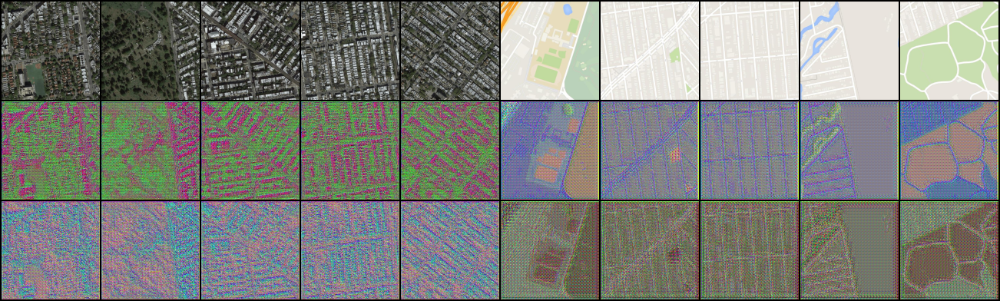

In [8]:
G, F, Dx, Dy, opt_gen, opt_disc = model_init()
write_image(G, F)

初期状態↑。

一番上が元画像、真ん中がそれらを対応する生成器で変換した画像、一番下がそれをさらに逆の生成器で戻した画像。

Epoch 1/10: 100%|██████████| 1096/1096 [00:32<00:00, 33.55it/s]


loss_Dx: 0.02731 | loss_Dy: 0.0238 | loss_gen: 12.8653


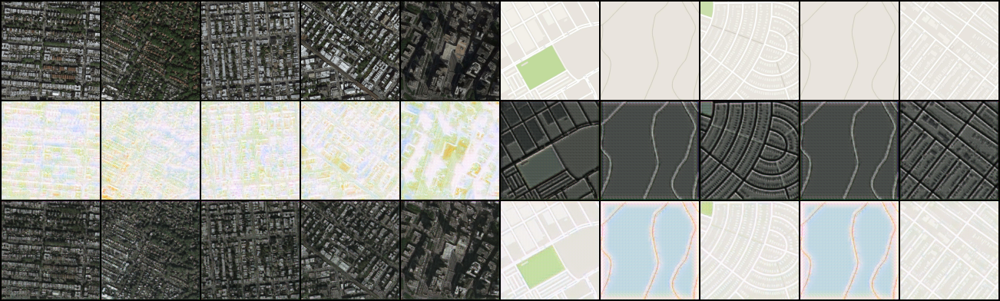

Epoch 2/10: 100%|██████████| 1096/1096 [00:32<00:00, 33.98it/s]

loss_Dx: 0.002804 | loss_Dy: 0.0070 | loss_gen: 10.9377


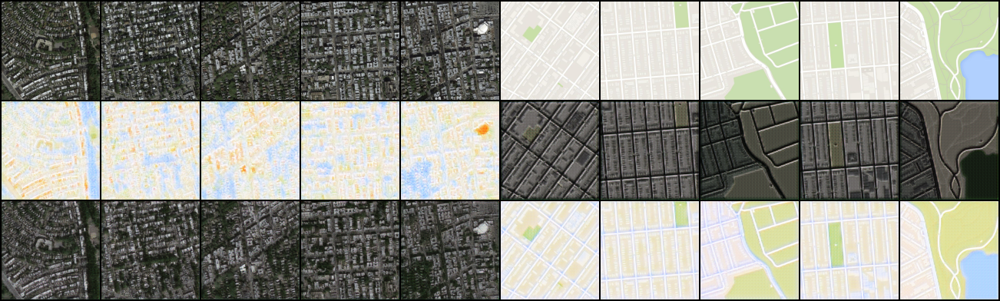

Epoch 3/10: 100%|██████████| 1096/1096 [00:32<00:00, 34.05it/s]


loss_Dx: 0.002616 | loss_Dy: 0.0057 | loss_gen: 10.2897


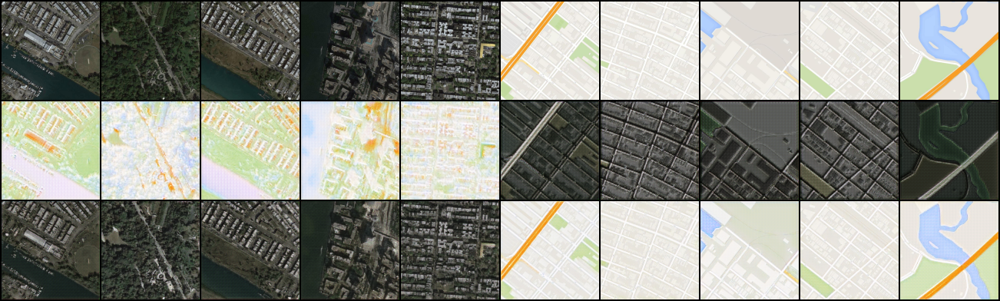

Epoch 4/10: 100%|██████████| 1096/1096 [00:32<00:00, 34.08it/s]


loss_Dx: 0.005328 | loss_Dy: 0.0122 | loss_gen: 9.6992


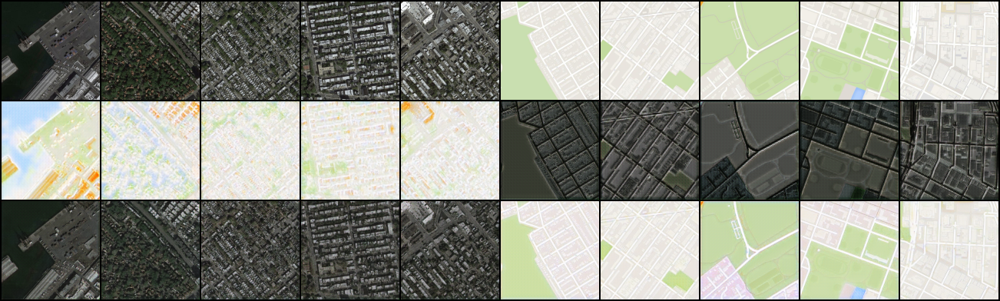

Epoch 5/10: 100%|██████████| 1096/1096 [00:32<00:00, 34.04it/s]


loss_Dx: 0.001533 | loss_Dy: 0.0035 | loss_gen: 9.7725


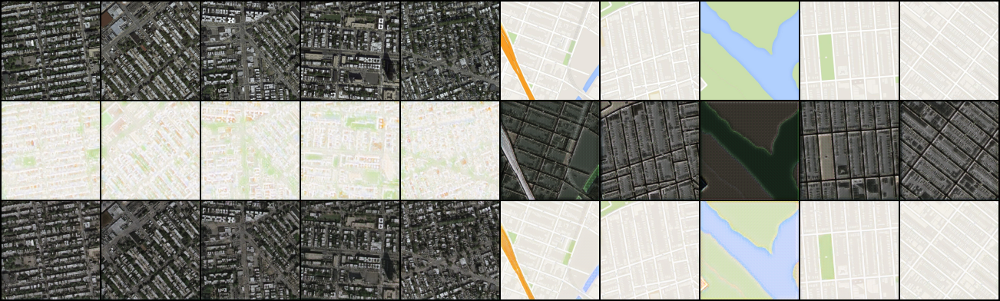

Epoch 6/10: 100%|██████████| 1096/1096 [00:32<00:00, 33.71it/s]


loss_Dx: 0.01658 | loss_Dy: 0.0020 | loss_gen: 9.6835


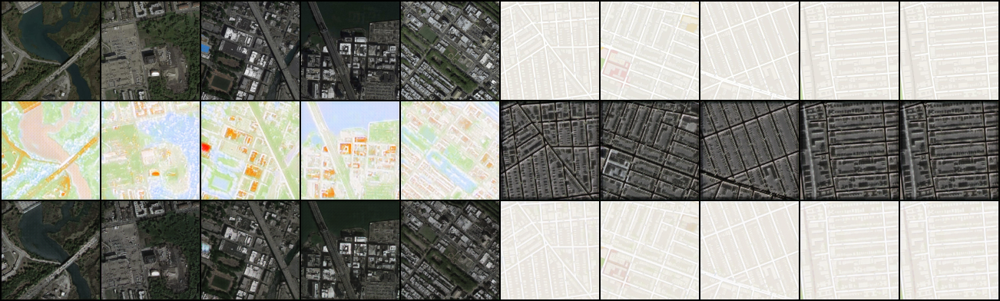

Epoch 7/10: 100%|██████████| 1096/1096 [00:34<00:00, 32.18it/s]


loss_Dx: 0.002106 | loss_Dy: 0.0085 | loss_gen: 9.4446


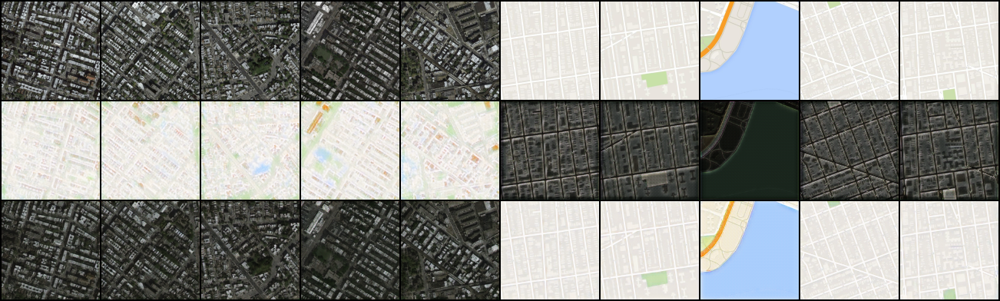

Epoch 8/10: 100%|██████████| 1096/1096 [00:39<00:00, 27.80it/s]


loss_Dx: 0.0007982 | loss_Dy: 0.0020 | loss_gen: 9.2518


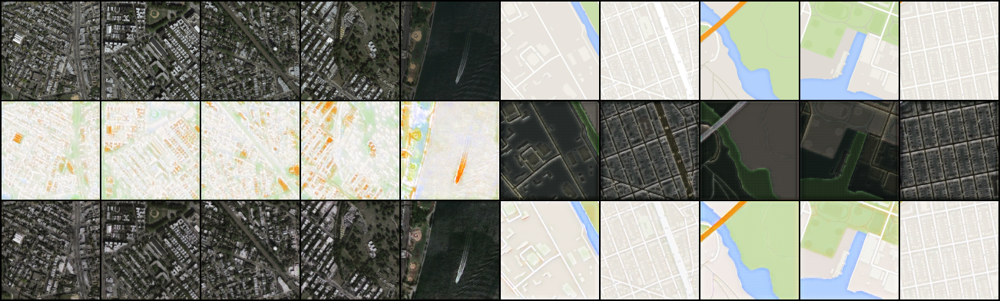

Epoch 9/10: 100%|██████████| 1096/1096 [00:39<00:00, 27.47it/s]


loss_Dx: 0.001681 | loss_Dy: 0.0065 | loss_gen: 9.3789


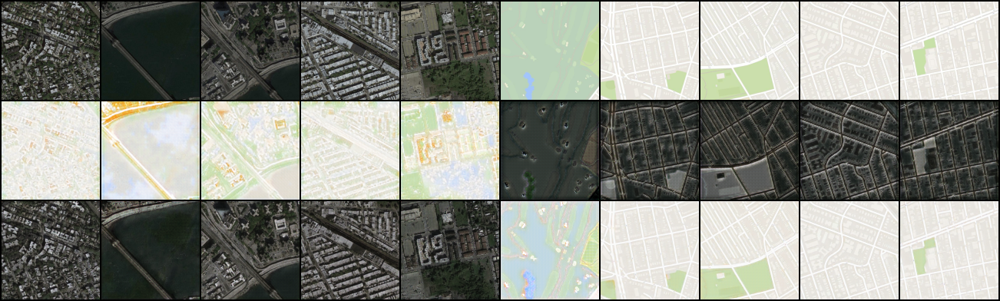

Epoch 10/10: 100%|██████████| 1096/1096 [00:39<00:00, 28.05it/s]


loss_Dx: 0.004875 | loss_Dy: 0.0013 | loss_gen: 9.3732


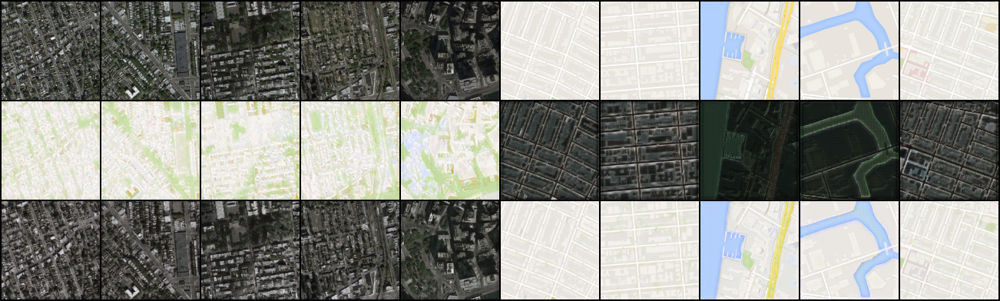

In [9]:
options = {
    "n_epochs": 10,
    "lambda_idt": 0.,
    "lambda_cycle": 5.,
    "lambda_adv": 5.,
}

train(G, F, Dx, Dy, opt_gen, opt_disc, dataloader, options)